<a href="https://colab.research.google.com/github/Himasnhu-AT/Binary-Video-Compression-Technology-Prototype/blob/main/Copy_of_fcc_cat_dog.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
try:
  # This command only in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [2]:
# Get project files
!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip cats_and_dogs.zip

PATH = 'cats_and_dogs'

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
test_dir = os.path.join(PATH, 'test')

# Get number of files in each directory. The train and validation directories
# each have the subdirecories "dogs" and "cats".
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_test = len(os.listdir(test_dir))

# Variables for pre-processing and training.
batch_size = 128
epochs = 15
IMG_HEIGHT = 150
IMG_WIDTH = 150

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.60.jpg  
  inflating: cats_and_dogs/train/dogs/dog.858.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.858.jpg  
  inflating: cats_and_dogs/train/dogs/dog.680.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.680.jpg  
  inflating: cats_and_dogs/train/dogs/dog.694.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.694.jpg  
  inflating: cats_and_dogs/train/dogs/dog.864.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.864.jpg  
  inflating: cats_and_dogs/train/dogs/dog.870.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.870.jpg  
  inflating: cats_and_dogs/train/dogs/dog.871.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.871.jpg  
  inflating: cats_and_dogs/train/dogs/dog.865.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.865.jpg  
  inflating: cats_and_dogs/train/dogs/dog.695.jpg  
  inflating: __MACOSX/cats_and

In [3]:
# Create image generators
train_image_generator = ImageDataGenerator(rescale=1./255)
train_data_gen = train_image_generator.flow_from_directory(
    directory='cats_and_dogs/train',
    batch_size=32,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    class_mode='binary'
)

validation_image_generator = ImageDataGenerator(rescale=1./255)
val_data_gen = validation_image_generator.flow_from_directory(
    directory='cats_and_dogs/validation',
    batch_size=32,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    class_mode='binary'
)

test_image_generator = ImageDataGenerator(rescale=1./255)
test_data_gen = test_image_generator.flow_from_directory(
    directory='cats_and_dogs/test',
    batch_size=1,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    class_mode=None,
    shuffle=False
)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 0 images belonging to 0 classes.


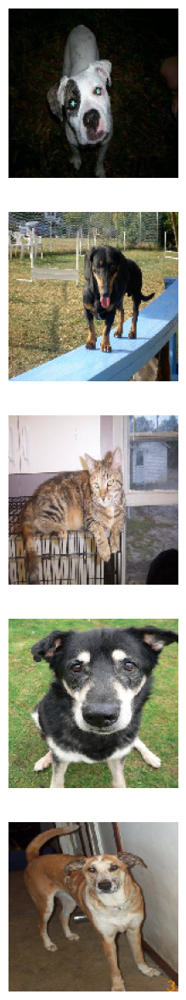

In [4]:
# 4
def plotImages(images_arr, probabilities = False):
    fig, axes = plt.subplots(len(images_arr), 1, figsize=(5,len(images_arr) * 3))
    if probabilities is False:
      for img, ax in zip( images_arr, axes):
          ax.imshow(img)
          ax.axis('off')
    else:
      for img, probability, ax in zip( images_arr, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')
          if probability > 0.5:
              ax.set_title("%.2f" % (probability*100) + "% dog")
          else:
              ax.set_title("%.2f" % ((1-probability)*100) + "% cat")
    plt.show()

sample_training_images, _ = next(train_data_gen)
plotImages(sample_training_images[:5])


In [5]:
# 5
# Recreate the train_image_generator with random transformations
train_image_generator = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)



Found 2000 images belonging to 2 classes.


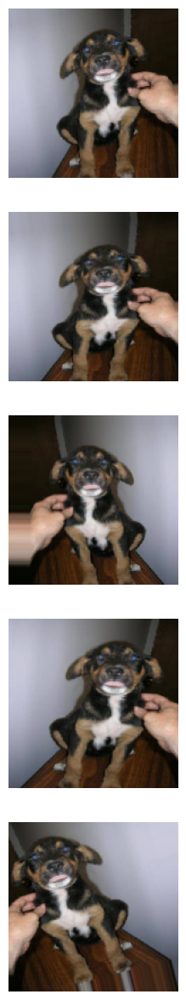

In [6]:
# 6
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

augmented_images = [train_data_gen[0][0][0] for i in range(5)]

plotImages(augmented_images)

In [8]:
# 7

# Create the model
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)     

In [9]:
# 8

# Train the model
history = model.fit(
    train_data_gen,
    steps_per_epoch=train_data_gen.samples // train_data_gen.batch_size,
    epochs=10,
    validation_data=val_data_gen,
    validation_steps=val_data_gen.samples // val_data_gen.batch_size
)

Epoch 1/10
15/15 [==============================] - 141s 9s/step - loss: 0.8545 - accuracy: 0.5094 - val_loss: 0.6960 - val_accuracy: 0.4980
Epoch 2/10
15/15 [==============================] - 129s 9s/step - loss: 0.6972 - accuracy: 0.5000 - val_loss: 0.6924 - val_accuracy: 0.5050
Epoch 3/10
15/15 [==============================] - 129s 9s/step - loss: 0.6919 - accuracy: 0.5449 - val_loss: 0.6891 - val_accuracy: 0.5917
Epoch 4/10
15/15 [==============================] - 130s 9s/step - loss: 0.6877 - accuracy: 0.5577 - val_loss: 0.6771 - val_accuracy: 0.5726
Epoch 5/10
15/15 [==============================] - 139s 9s/step - loss: 0.6685 - accuracy: 0.5983 - val_loss: 0.6436 - val_accuracy: 0.6280
Epoch 6/10
15/15 [==============================] - 129s 9s/step - loss: 0.6371 - accuracy: 0.6319 - val_loss: 0.6394 - val_accuracy: 0.6351
Epoch 7/10
15/15 [==============================] - 125s 8s/step - loss: 0.6363 - accuracy: 0.6378 - val_loss: 0.6379 - val_accuracy: 0.6562
Epoch 8/10
15

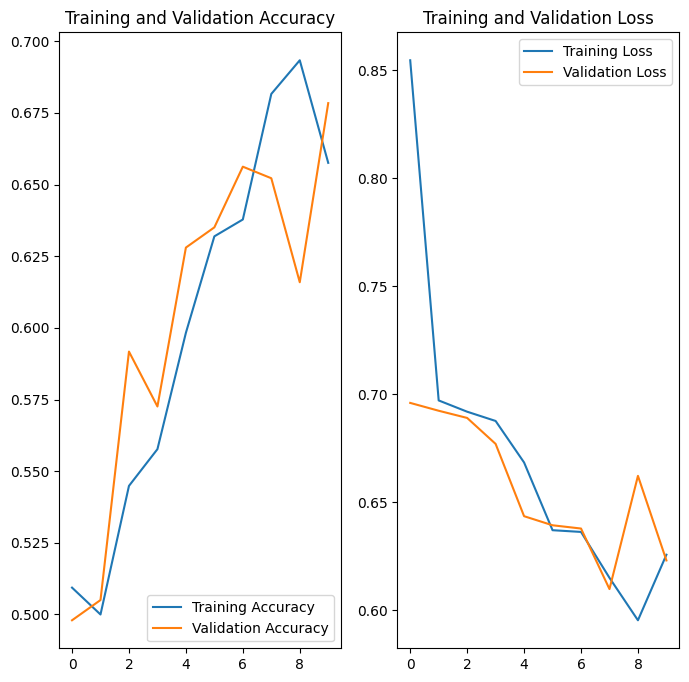

In [11]:
import matplotlib.pyplot as plt

# Get the accuracy and loss values from the history object
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(10)  # Assuming you trained for 10 epochs

# Plot the training and validation accuracy
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plot the training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

# Show the plot
plt.show()


# Import the necessary libraries
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Function to load and preprocess a single image
def preprocess_image(image_path):
    try:
        img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = img_to_array(img)
        img_array /= 255.0
        img_array = img_array.reshape(1, IMG_HEIGHT, IMG_WIDTH, 3)
        return img_array
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None

# Get the list of test image files
test_dir = 'cats_and_dogs/test'
test_files = sorted(os.listdir(test_dir))

# Predict and plot the test images with their corresponding probabilities
for test_file in test_files:
    image_path = os.path.join(test_dir, test_file)
    image_array = preprocess_image(image_path)
    
    if image_array is not None:
        probability = model.predict(image_array)[0][0]
        
        label = 'Cat' if probability < 0.5 else 'Dog'
        certainty = probability * 100
        
        plt.imshow(load_img(image_path))
        plt.title(f'{label} ({certainty:.2f}% certain)')
        plt.axis('off')
        plt.show()


Error processing image cats_and_dogs/test/.DS_Store: cannot identify image file <_io.BytesIO object at 0x7f16d8c5f150>
1/1 [==============================] - 0s 35ms/step


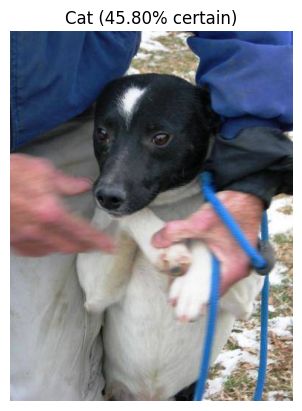

1/1 [==============================] - 0s 41ms/step


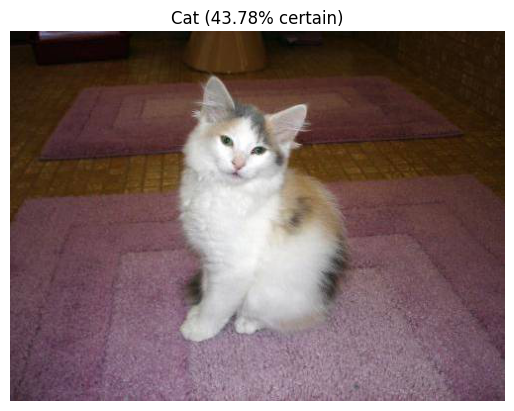

1/1 [==============================] - 0s 40ms/step


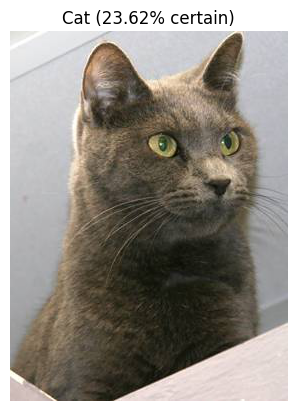

1/1 [==============================] - 0s 34ms/step


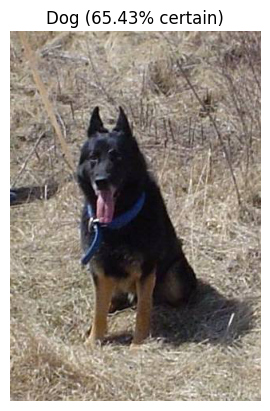

1/1 [==============================] - 0s 35ms/step


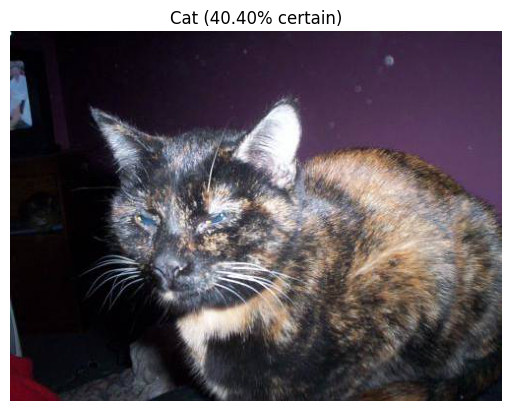

1/1 [==============================] - 0s 40ms/step


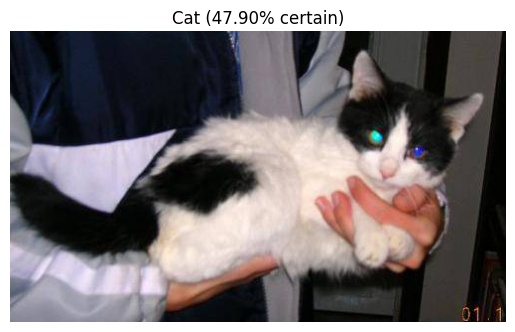

1/1 [==============================] - 0s 40ms/step


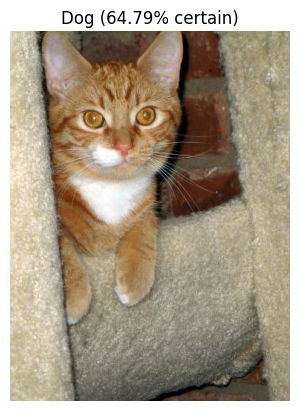

1/1 [==============================] - 0s 41ms/step


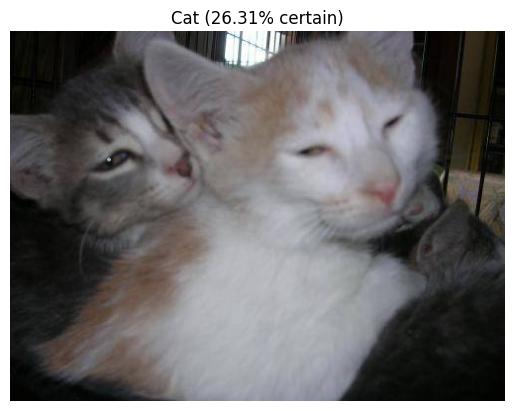

1/1 [==============================] - 0s 47ms/step


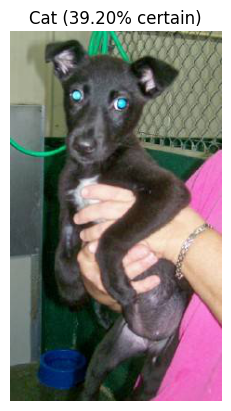

1/1 [==============================] - 0s 37ms/step


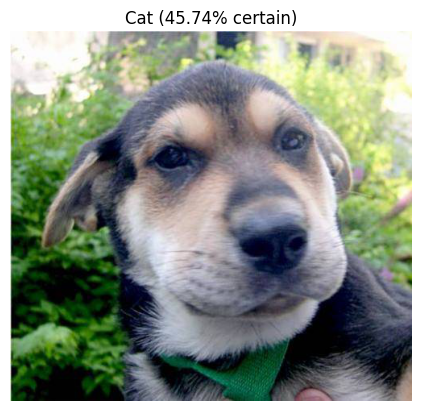

1/1 [==============================] - 0s 53ms/step


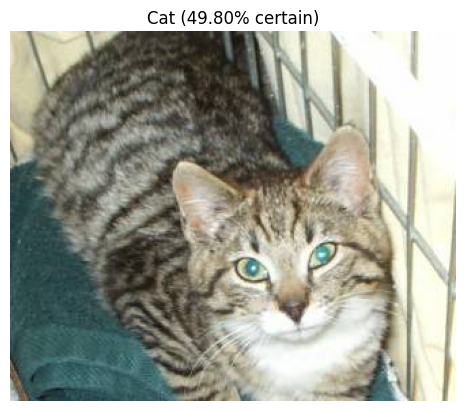

1/1 [==============================] - 0s 55ms/step


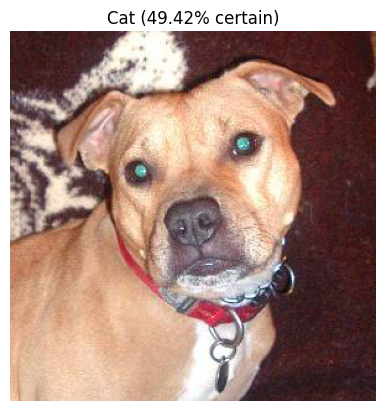

1/1 [==============================] - 0s 50ms/step


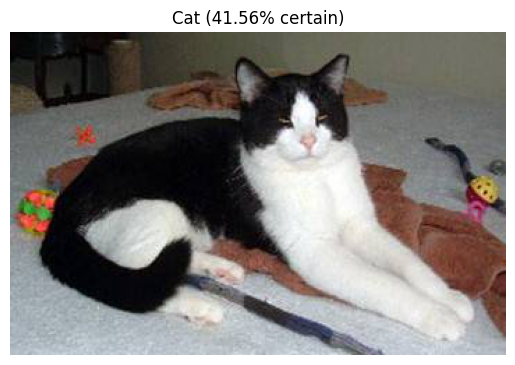

1/1 [==============================] - 0s 47ms/step


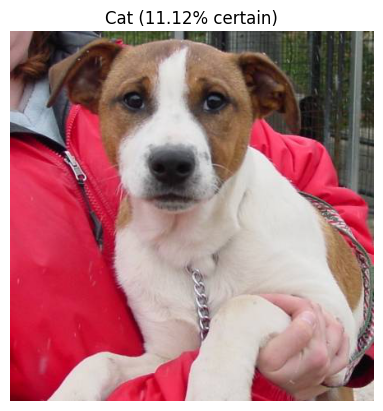

1/1 [==============================] - 0s 50ms/step


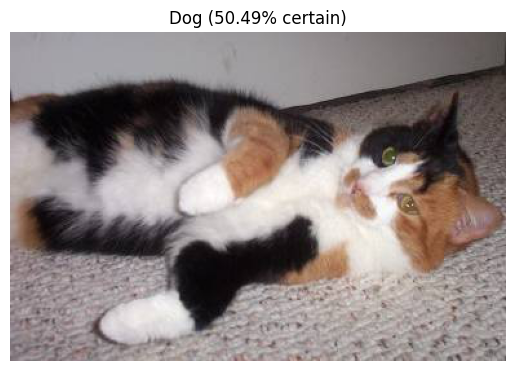

1/1 [==============================] - 0s 49ms/step


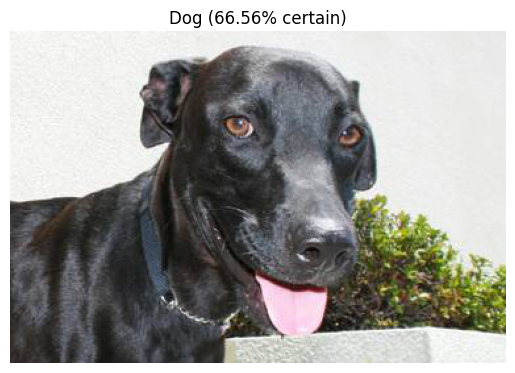

1/1 [==============================] - 0s 53ms/step


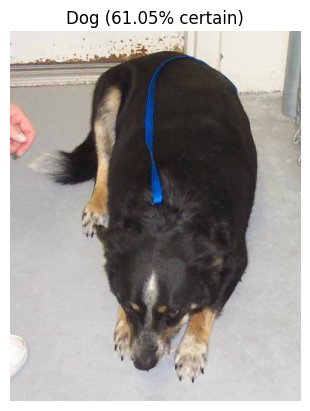

1/1 [==============================] - 0s 49ms/step


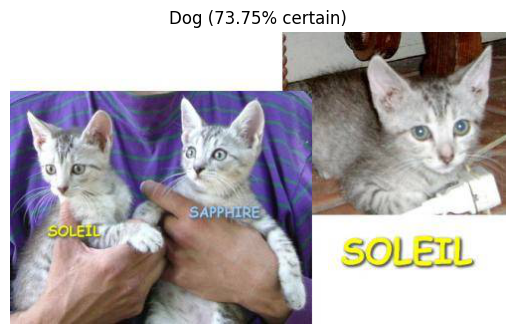

1/1 [==============================] - 0s 51ms/step


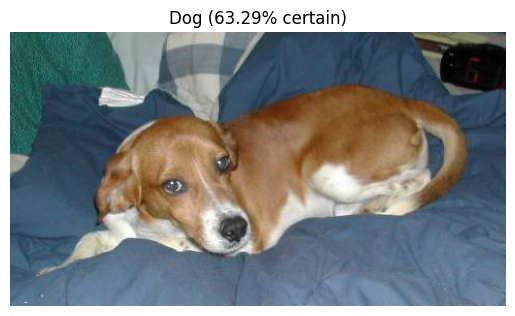

1/1 [==============================] - 0s 51ms/step


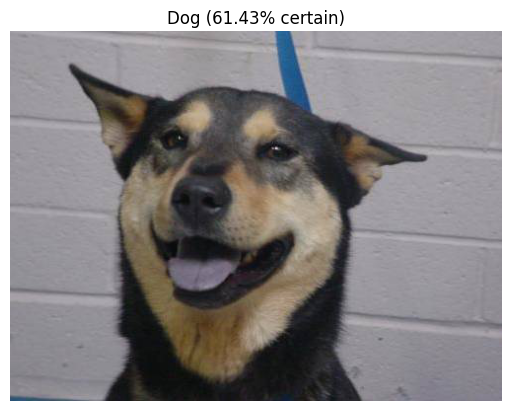

1/1 [==============================] - 0s 52ms/step


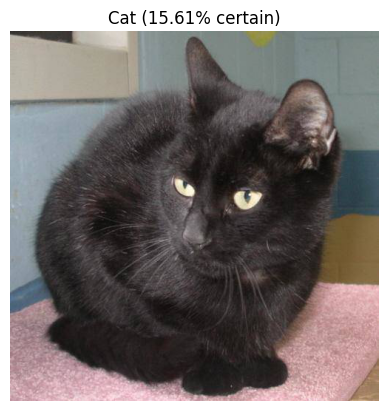

1/1 [==============================] - 0s 52ms/step


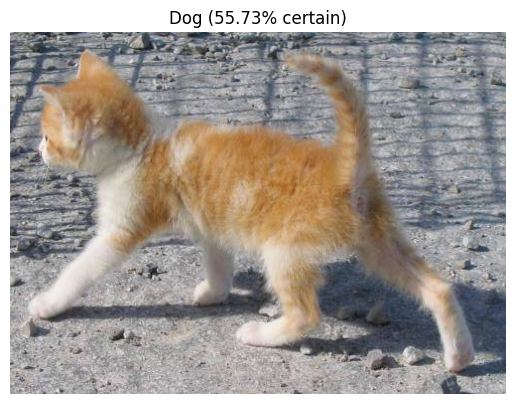

1/1 [==============================] - 0s 53ms/step


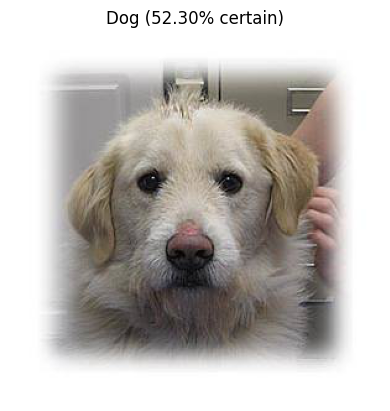

1/1 [==============================] - 0s 59ms/step


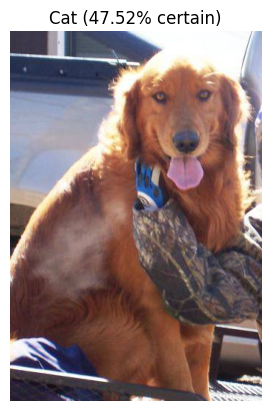

1/1 [==============================] - 0s 67ms/step


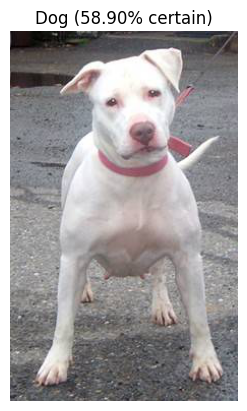

1/1 [==============================] - 0s 83ms/step


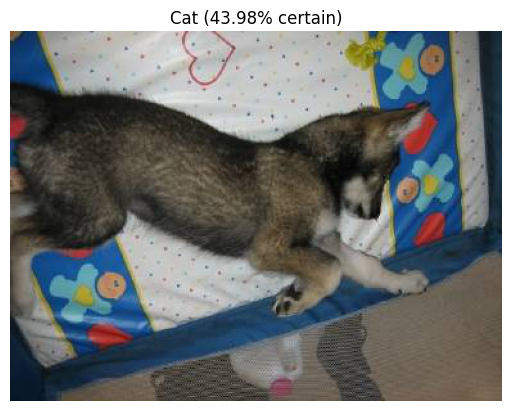

1/1 [==============================] - 0s 79ms/step


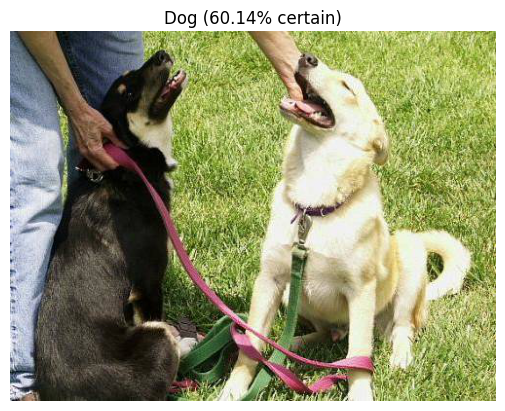

1/1 [==============================] - 0s 71ms/step


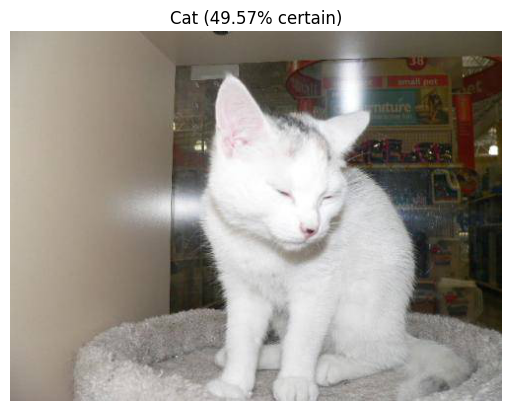

1/1 [==============================] - 0s 58ms/step


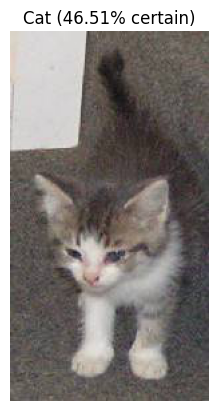

1/1 [==============================] - 0s 52ms/step


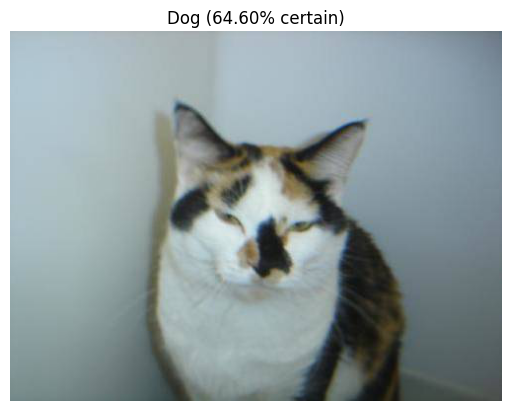

1/1 [==============================] - 0s 67ms/step


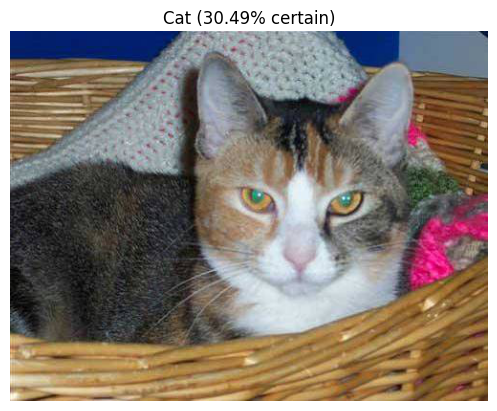

1/1 [==============================] - 0s 64ms/step


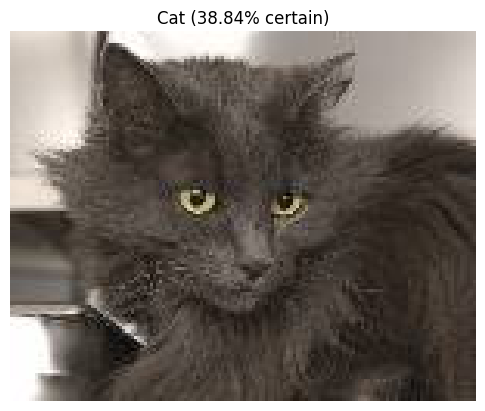

1/1 [==============================] - 0s 62ms/step


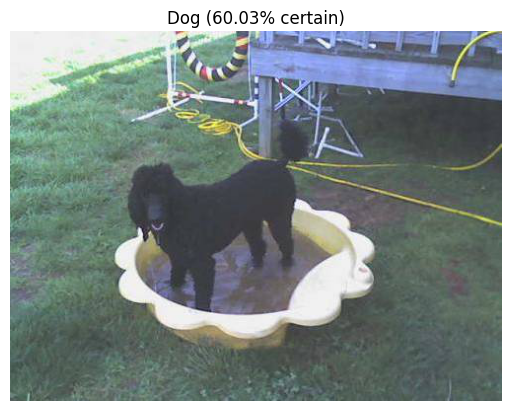

1/1 [==============================] - 0s 70ms/step


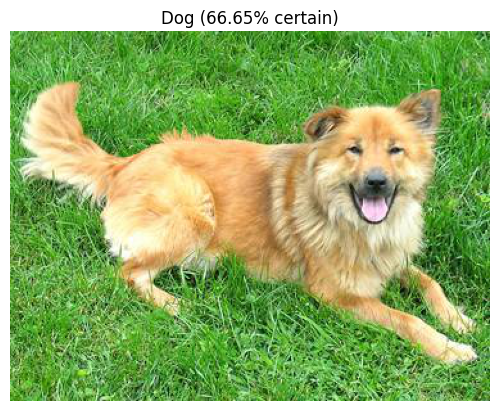

1/1 [==============================] - 0s 50ms/step


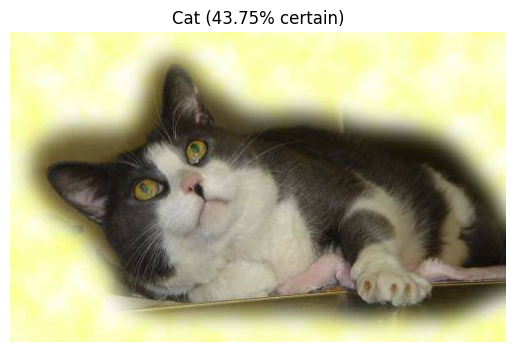

1/1 [==============================] - 0s 54ms/step


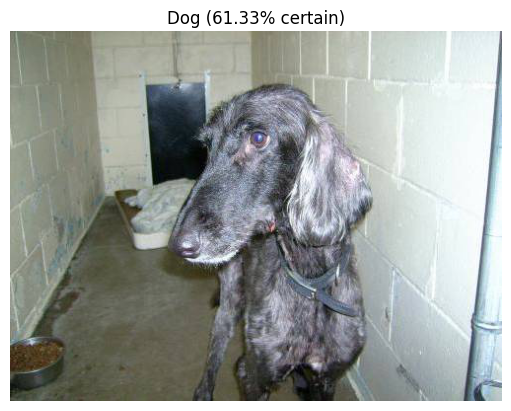

1/1 [==============================] - 0s 51ms/step


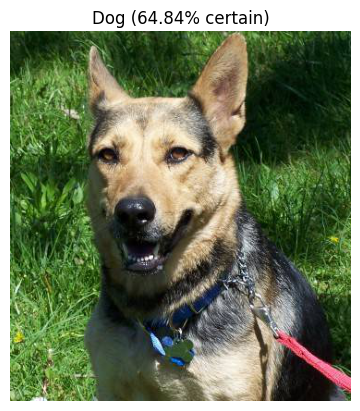

1/1 [==============================] - 0s 52ms/step


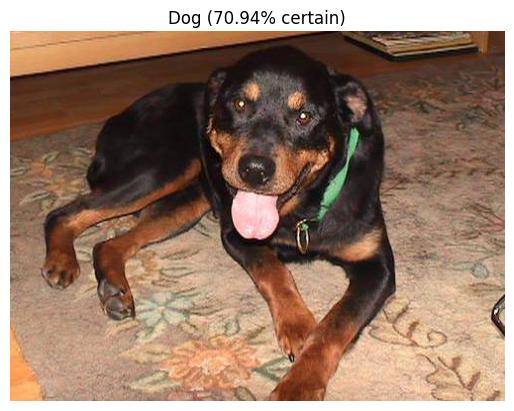

1/1 [==============================] - 0s 58ms/step


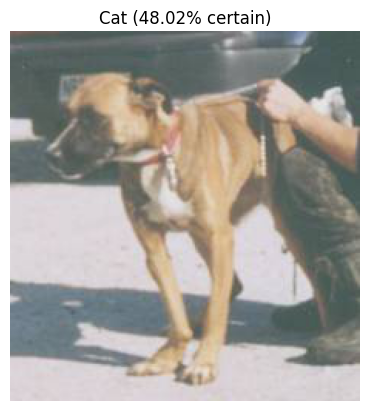

1/1 [==============================] - 0s 50ms/step


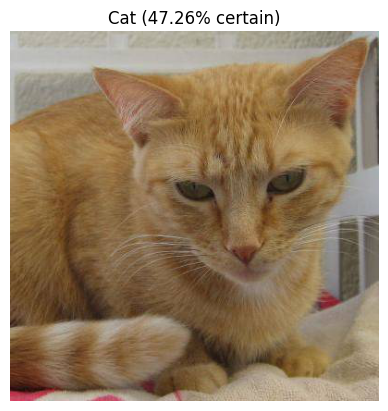

1/1 [==============================] - 0s 51ms/step


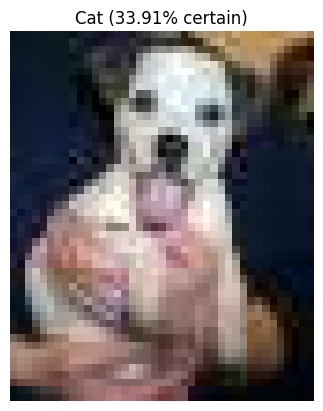

1/1 [==============================] - 0s 50ms/step


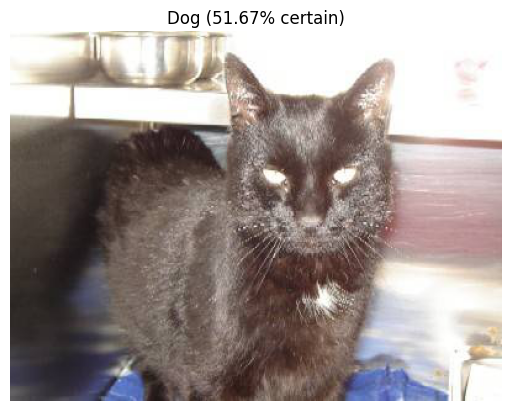

1/1 [==============================] - 0s 50ms/step


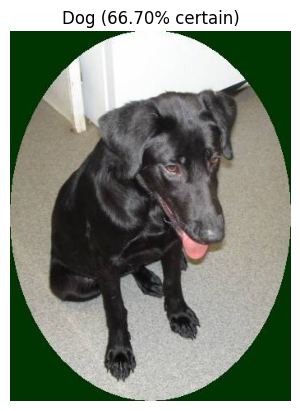

1/1 [==============================] - 0s 52ms/step


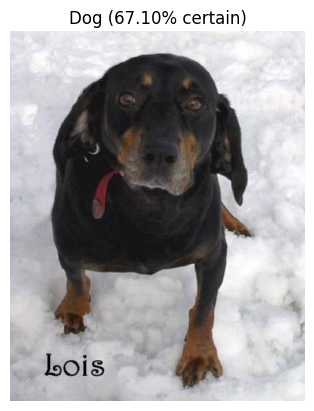

1/1 [==============================] - 0s 55ms/step


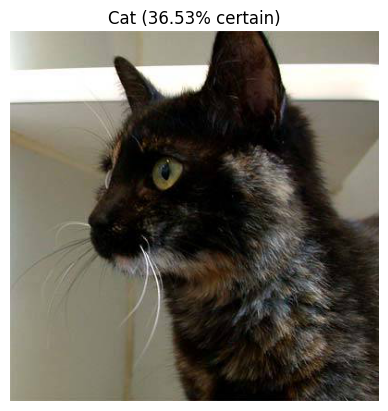

1/1 [==============================] - 0s 49ms/step


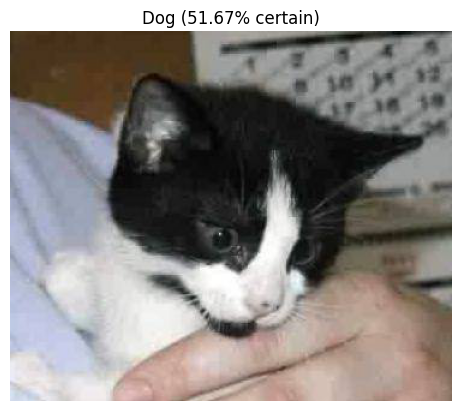

1/1 [==============================] - 0s 51ms/step


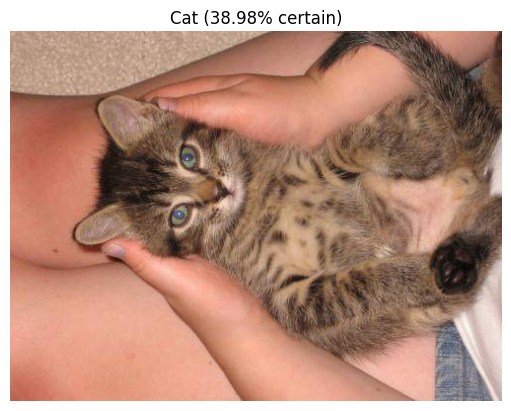

1/1 [==============================] - 0s 53ms/step


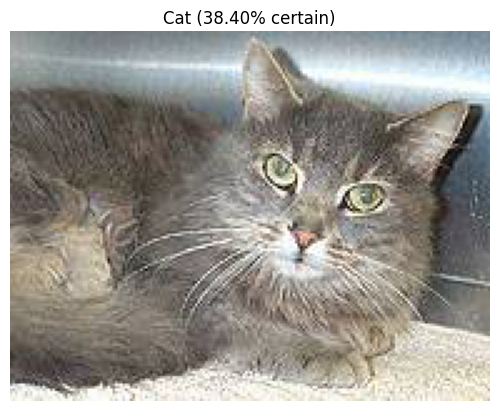

1/1 [==============================] - 0s 55ms/step


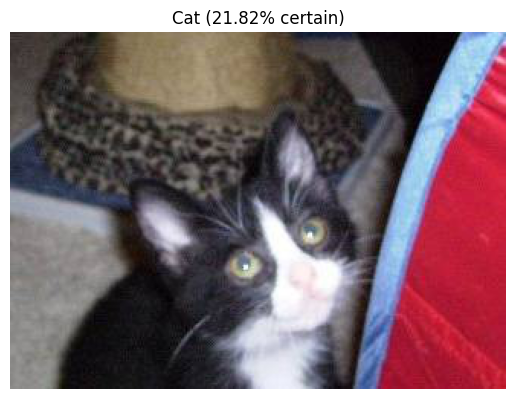

1/1 [==============================] - 0s 55ms/step


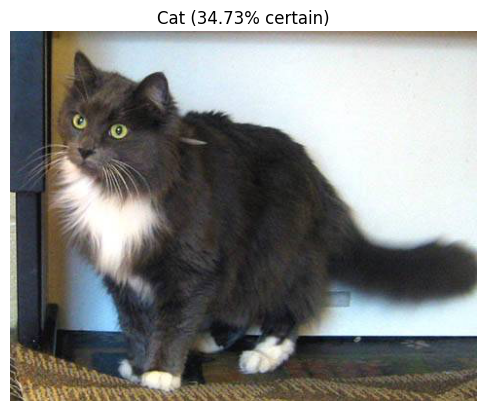

In [19]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def preprocess_image(image_path):
    try:
        img = load_img(image_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = img_to_array(img)
        img_array /= 255.0
        img_array = img_array.reshape(1, IMG_HEIGHT, IMG_WIDTH, 3)
        return img_array
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None

test_dir = 'cats_and_dogs/test'
test_files = sorted(os.listdir(test_dir))

for test_file in test_files:
    image_path = os.path.join(test_dir, test_file)
    image_array = preprocess_image(image_path)

    if image_array is not None:
        probability = model.predict(image_array)[0][0]

        label = 'Cat' if probability < 0.5 else 'Dog'
        certainty = probability * 100

        plt.imshow(load_img(image_path))
        plt.title(f'{label} ({certainty:.2f}% certain)')
        plt.axis('off')
        plt.show()


In [21]:
# 11
answers =  [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
            1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
            1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
            1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 
            0, 0, 0, 0, 0, 0]

correct = 0

# Get the probabilities for each test image
probabilities = []
for test_file in test_files:
    image_path = os.path.join(test_dir, test_file)
    image_array = preprocess_image(image_path)

    if image_array is not None:
        probability = model.predict(image_array)[0][0]
        probabilities.append(probability)


for probability, answer in zip(probabilities, answers):
  if round(probability) == answer:
    correct +=1

percentage_identified = (correct / len(answers)) * 100

passed_challenge = percentage_identified >= 63

print(f"Your model correctly identified {round(percentage_identified, 2)}% of the images of cats and dogs.")

if passed_challenge:
  print("You passed the challenge!")
else:
  print("You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!")

Error processing image cats_and_dogs/test/.DS_Store: cannot identify image file <_io.BytesIO object at 0x7f16d7dd7060>
1/1 [==============================] - 0s 33ms/step
Your model correctly identified 68.0% of the images of cats and dogs.
You passed the challenge!
